#  Exercises

##  ADC summary

```{figure} ../../img/adc/propagator.png
---
name: fig-propagator-exercises
align: center
---
```

$$
\Pi_{pq,rs}(\omega) = \frac{1}{\hbar} \sum_{n>0} \left( \frac{\bra{\Psi_0} \hat{a}_q^\dagger \hat{a}_p \ket{\Psi_n} \bra{\Psi_n} \hat{a}_r^\dagger \hat{a}_s \ket{\Psi_0}}{\omega - \omega_{n0} + i \gamma_n} + \frac{\bra{\Psi_0} \hat{a}_s^\dagger \hat{a}_r \ket{\Psi_n} \bra{\Psi_n} \hat{a}_p^\dagger \hat{a}_q \ket{\Psi_0}}{-\omega - \omega_{n0} - i \gamma_n} \right)\,
$$


The poles and residues of the polarization propagator described by the spectral representation describe excitation energies and transition amplitudes, respectively. One possible strategy to determine these quantities is to expand $\Pi_{pq,rs}$ in a time-dependent perturbation series based on a Hamiltonian partitioned in the same way as for the Møller$-$Plesset ground-state. This expansion is also called a diagrammatic expansion because each term in the series can be represented by a Feynman diagram (see figure above). The above equation can be regarded as the diagonal form of the polarization propagator, which,
when considering only the first term and ignoring the broadening, can be written in matrix form as

$$
\boldsymbol{\Pi}(\omega) = \mathbf{x}^\dagger (\hbar \omega \mathbb{1} - \boldsymbol{\Omega})^{-1} \mathbf{x} \, 
$$

or in non-diagonal form,

$$
\boldsymbol{\Pi}(\omega) = \mathbf{f}^\dagger (\hbar \omega \mathbb{1} - \mathbf{M})^{-1} \mathbf{f} \, 
$$


###  ISR for ADC(0) and ADC(1)

The elements of the ADC matrix $\mathbf{M}$ are obtained as matrix elements of the shifted Hamiltonian in the basis of the intermediate states,

```{figure} ../../img/adc/adc2_isr.png
---
name: fig-adc2-isr-exercises
align: center
width: 400px
---
```

This representation of the shifted Hamiltonian leads to a Hermitian eigenvalue equation, 

$$
  \mathbf{MX} = \mathbf{X\Omega} \, , \quad \mathbf{X}^\dagger \mathbf{X} = \mathbb{1} \, 
$$

yielding vertical excitation energies ($\omega_{n0} = E_n - E_0$) and the corresponding excitation vectors $\mathbf{X}_n$. 

Expanding in series the ADC matrix elements in terms of the perturbation, explicit expressions are obtained,

$$
M_{ia,jb}^{(0)} =(\varepsilon_a - \varepsilon_i) \delta_{ab} \delta_{ij}
$$
$$
M_{ia,jb}^{(1)} = -\braket{ja||ib}
$$
$$
...
$$

In the following, we will construct the ADC(0) and ADC(1) matrices for the water molecule using a minimal basis set (STO-3G). This will allow us to visualize the entire matrices and obtain the eigenvalues and eigenvectors. The first step is to carry out a HF reference calculation to obtain the orbital eigenvalues and two electron repulsion integrals in MO basis required by the matrix elements above.

In [2]:
import veloxchem as vlx
import gator
import py3Dmol as p3d
import numpy as np
from veloxchem.mointsdriver import MOIntegralsDriver

from matplotlib import pyplot as plt
from matplotlib import colormaps

np.set_printoptions(precision=3, suppress=True)

# Conversion from Hartree to eV for later use
au2ev = vlx.veloxchemlib.hartree_in_ev()

lih_xyz = """2

Li  0.000000   0.000000   0.000000
H   0.000000   0.000000   1.000000
"""

water_xyz = """3

O       0.0000000000     0.0000000000     0.1178336003
H      -0.7595754146    -0.0000000000    -0.4713344012
H       0.7595754146     0.0000000000    -0.4713344012
"""

name = "h2o"


molecule = vlx.Molecule.read_xyz_string(water_xyz)

basis_set_label = "sto-3g"
basis = vlx.MolecularBasis.read(molecule, basis_set_label)

* Warning * Environment variable OMP_NUM_THREADS not set.
* Warning * Setting OMP_NUM_THREADS to 8.
* Info * Reading basis set from file: /home/emi/miniconda3/envs/echem/lib/python3.11/site-packages/veloxchem/basis/STO-3G 
                                                                                                                          
                                              Molecular Basis (Atomic Basis)                                              
                                                                                                                          
                               Basis: STO-3G                                                                              
                                                                                                                          
                               Atom Contracted GTOs           Primitive GTOs                                              
                                       

In [3]:
viewer = p3d.view(viewergrid=(1, 1), width=500, height=300)
viewer.addModel(water_xyz, 'xyz', viewer=(0, 0))
viewer.setViewStyle({"style": "outline", "width": 0.05})
viewer.setStyle({"stick":{},"sphere": {"scale":0.25}})
# viewer.rotate(90,'y')
viewer.rotate(-90,'x')
viewer.show()

You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

### **Step 1**. Calculate the reference state 

In [4]:
# SCF will be run by VeloxChem through Gator
scf = gator.run_scf(molecule, basis, conv_thresh=1e-10, verbose=True)

                                                                                                                          
                                            Self Consistent Field Driver Setup                                            
                                                                                                                          
                   Wave Function Model             : Spin-Restricted Hartree-Fock                                         
                   Initial Guess Model             : Superposition of Atomic Densities                                    
                   Convergence Accelerator         : Two Level Direct Inversion of Iterative Subspace                     
                   Max. Number of Iterations       : 50                                                                   
                   Max. Number of Error Vectors    : 10                                                                   
                

In [5]:
# Let's have a look at the molecular orbitals
orb_viewer = vlx.OrbitalViewer()
orb_viewer.plot(molecule, basis, scf.mol_orbs)

Output()

Dropdown(description='Orbital:', index=4, options=(('  1 occ=2.000 ene=-20.242', 0), ('  2 occ=2.000 ene=-1.26…

###  **Step 2**. Construct the ADC(0) and ADC(1) matrices 

The ADC(0) matrix consists of only $\mathbf{M}^{(0)}$ matrix elements, while the ADC(1) matrix is $\mathbf{M} = \mathbf{M}^{(0)} + \mathbf{M}^{(1)}$. As discussed above and using *spin-orbitals*,

$$
M_{ia,jb}^{(0)} =(\varepsilon_a - \varepsilon_i) \delta_{ab} \delta_{ij}
$$
$$
M_{ia,jb}^{(1)} = -\braket{ja||ib}
$$

For a closed-shell restricted HF reference, $M_{ia,jb}^{(1)}$ can be written in terms of _spatial_ orbitals (in Chemist's notation) as

$$
   M^{(1)}_{ia,jb} =  2 \left(ia|jb\right) - \left(ij|ab\right) \, ,
$$


Let's extract the MO energies and two-electron integrals:

In [6]:
# MO energies in diagonal matrix
mo_energies = np.diag(scf.scf_tensors['E_alpha'])

# Two-electron integrals from vlx
moints_drv = MOIntegralsDriver()
oovv = moints_drv.compute_in_memory(molecule, basis, scf.mol_orbs, "chem_OOVV")
ovov = moints_drv.compute_in_memory(molecule, basis, scf.mol_orbs, "chem_OVOV")

Construct the ADC matrices:

```python
# Number of occupied and virtual orbitals
nocc = molecule.number_of_alpha_electrons()
norb = mo_energies.shape[0]
nvir = norb - nocc
nexc = nocc * nvir # number of excited (singlet or triplet) states in ADC(1)
print("nocc: ", nocc)
print("nvir: ", nvir)

# ADC matrices with zeroes
adc0_mat4d = np.zeros((nocc, nvir, nocc, nvir))
adc1_mat4d = np.zeros((nocc, nvir, nocc, nvir))

# Loop over all indices and fill matrix with corresponding elements
for i in range(nocc):
    for a in range(nvir):
        # Fill the diagonal (orbital-energy differences)
        adc0_mat4d[i,a,i,a] = ...
        adc1_mat4d[i,a,i,a] = ...
        for j in range(nocc):
            for b in range(nvir):
                # Fill the rest (two-electron integrals)
                ...
                ...
```

In [8]:
# Number of occupied and virtual orbitals
nocc = molecule.number_of_alpha_electrons()
norb = mo_energies.shape[0]
nvir = norb - nocc
nexc = nocc * nvir # number of excited (singlet or triplet) states in ADC(1)
print("nocc: ", nocc)
print("nvir: ", nvir)

# ADC matrices with zeroes
adc0_mat4d = np.zeros((nocc, nvir, nocc, nvir))
adc1_mat4d = np.zeros((nocc, nvir, nocc, nvir))

# Loop over all indices and fill matrix with corresponding elements
for i in range(nocc):
    for a in range(nvir):
        # Fill the diagonal (orbital-energy differences)
        adc0_mat4d[i,a,i,a] = mo_energies[nocc+a,nocc+a] - mo_energies[i,i]
        adc1_mat4d[i,a,i,a] = mo_energies[nocc+a,nocc+a] - mo_energies[i,i]
        for j in range(nocc):
            for b in range(nvir):
                # Fill the rest (two-electron integrals)
                adc1_mat4d[i,a,j,b] -= oovv[i,j,a,b] #ovov[j,a,i,b]
                adc1_mat4d[i,a,j,b] += 2 * ovov[i,a,j,b] #2*oovv[i,j,a,b]

nocc:  5
nvir:  2


Reshape into 2D matrices:

In [9]:
# Reshape the 4D into 2D matrices
adc0_mat2d = adc0_mat4d.reshape((nocc*nvir, nocc*nvir))
print("closed-shell ADC(0) matrix:\n", adc0_mat2d.shape, "\n", adc0_mat2d)
adc1_mat2d = adc1_mat4d.reshape((nocc*nvir, nocc*nvir))
print("\nclosed-shell ADC(1) matrix:\n", adc1_mat2d.shape, "\n", adc1_mat2d)

closed-shell ADC(0) matrix:
 (10, 10) 
 [[20.844  0.     0.     0.     0.     0.     0.     0.     0.     0.   ]
 [ 0.    20.98   0.     0.     0.     0.     0.     0.     0.     0.   ]
 [ 0.     0.     1.868  0.     0.     0.     0.     0.     0.     0.   ]
 [ 0.     0.     0.     2.004  0.     0.     0.     0.     0.     0.   ]
 [ 0.     0.     0.     0.     1.217  0.     0.     0.     0.     0.   ]
 [ 0.     0.     0.     0.     0.     1.353  0.     0.     0.     0.   ]
 [ 0.     0.     0.     0.     0.     0.     1.055  0.     0.     0.   ]
 [ 0.     0.     0.     0.     0.     0.     0.     1.19   0.     0.   ]
 [ 0.     0.     0.     0.     0.     0.     0.     0.     0.993  0.   ]
 [ 0.     0.     0.     0.     0.     0.     0.     0.     0.     1.128]]

closed-shell ADC(1) matrix:
 (10, 10) 
 [[20.104 -0.     0.021  0.     0.     0.023  0.022  0.     0.     0.   ]
 [-0.    20.154  0.     0.046  0.001 -0.     0.     0.03   0.     0.   ]
 [ 0.021  0.     1.458 -0.    -0.    -0.05

###  **Step 3**. Diagonalize the ADC matrix

```python
# Diagonalize the ADC(1) matrix using numpy
adc0_eigvals, adc0_eigvecs = ...
adc1_eigvals, adc1_eigvecs = ...

np.set_printoptions(precision=2, suppress=True)
print("Closed-shell ADC(0) eigenvalues (H):\n", adc0_eigvals)
print()
print("Closed-shell ADC(0) eigenvalues (eV):\n", adc0_eigvals * au2ev)
print()
print("Closed-shell ADC(1) eigenvalues (eV):\n", adc1_eigvals * au2ev)
np.set_printoptions(precision=3, suppress=True)
```

In [37]:
# Diagonalize the ADC(1) matrix using numpy
adc0_eigvals, adc0_eigvecs = np.linalg.eigh(adc0_mat2d)
adc1_eigvals, adc1_eigvecs = np.linalg.eigh(adc1_mat2d)

np.set_printoptions(precision=2, suppress=True)
print("Closed-shell ADC(0) eigenvalues (H):\n", adc0_eigvals)
print()
print("Closed-shell ADC(0) eigenvalues (eV):\n", adc0_eigvals * au2ev)
print()
print("Closed-shell ADC(1) eigenvalues (eV):\n", adc1_eigvals * au2ev)
np.set_printoptions(precision=3, suppress=True)

Closed-shell ADC(0) eigenvalues (H):
 [ 0.99  1.05  1.13  1.19  1.22  1.35  1.87  2.   20.84 20.98]

Closed-shell ADC(0) eigenvalues (eV):
 [ 27.02  28.7   30.7   32.38  33.13  36.81  50.84  54.52 567.2  570.88]

Closed-shell ADC(1) eigenvalues (eV):
 [ 13.09  15.03  16.7   19.07  21.94  28.96  40.07  40.97 547.07 548.43]


## The absorption spectrum

In order to simulate a UV/vis or X-ray spectra, apart from the excitation energies
also the spectral intensities are required. These are related to the _absorption cross-sections_ and _oscillator strengths_. The oscillator strengths are obtained from the _transition dipole moments_. In order to obtain the latter, the ground- to excited-state one-particle transition density matrix is required,

$$\mathbf{\gamma} = \mathbf{X}^\dagger \mathbf{f}$$

where a transition matrix element was defined as,
$$
\gamma_{pq} = \langle 0 | \hat{a}^\dagger_p\hat{a}_q | n\rangle = \sum_I \langle 0 | \hat{a}^\dagger_p\hat{a}_q | \tilde{\psi}_I \rangle x_I
$$


Through first order in perturbation theory, the non-vanishing part is given by

$$
\gamma_{ia} = \gamma^{(0)}_{ia} + \gamma^{(1)}_{ia} = x_{ia} - \sum_{jb} x_{jb} \, t_{ijab} \, ,
$$

where the $t$-amplitudes are 

$$t_{ijab} = \frac{\langle ab || ij \rangle}{\varepsilon_{a} + \varepsilon_{b} - \varepsilon_{i} - \varepsilon_{j}}$$

The transition dipole moment $T_{m}$ for the component $m \in \{ x,y,z \}$ is obtained
by contracting the transition density matrix with the corresponding dipole integrals $\mu_{ia}^{m}$,

$$
T_{m} = \sum_{ia} \gamma_{ia} \, \mu_{ia}^{m} \, ,
$$

and the dimensionless oscillator strength $f$, commonly used for relative intensities in the simulation
of electronic spectra, is obtained from quantities in atomic units as

$$
f = \frac23 \omega \, \sum_{m} T_{m}^2 \, ,
$$

where $\omega$ is the excitation energy of the corresponding excited state.

**In the CIS scheme, $\gamma_{ia} = x_{ia}$ is correct through zeroth order only. As a matter of fact, this is the only place where the ADC(1) and CIS methods differ.**

Let's use the excitation vectors to build the one-particle transition density matrices and calculate the oscillator strengths.

We must first get the t-amplitudes,

$$
t_{ijab} = \frac{\langle ij || ab\rangle}{\epsilon_a + \epsilon_b - \epsilon_i - \epsilon_j}
$$

In [11]:
# First, we need the t2-amplitudes
def get_t_amplitudes(molecule, basis, scf_drv):
    #t_aaaa, t_abab, t_abba
    #t_bbbb, t_baba, t_baab

    scf_results = scf_drv.scf_tensors

    N_O = molecule.number_of_alpha_electrons()
    # extract the occupied subset of the orbital energies
    e_occ = scf_results["E_alpha"][:N_O]
    # extract the virtual subset of the orbital energies
    e_vir = scf_results["E_alpha"][N_O:]
    N_V = e_vir.shape[0]
    
    # orbital energies and oovv integrals (spatial MO basis, physicists' notation)
    # we use physicists notation here, as it is more convenient from the algorithm point of view
    moeridrv = vlx.MOIntegralsDriver()
    oovv = moeridrv.compute_in_memory(molecule, basis, mol_orbs=scf_drv.mol_orbs, moints_name="phys_OOVV")
     
    e_ab = e_vir + e_vir.reshape(-1, 1) # epsilon_a + epsilon_b (as 2D matrix)
          
    # Different spin blocks (a=alpha, b=beta)
    t2_aaaa = np.zeros((N_O, N_O, N_V, N_V))
    t2_abab = np.zeros((N_O, N_O, N_V, N_V))
    t2_abba = np.zeros((N_O, N_O, N_V, N_V))
    for i in range(N_O):
        for j in range(N_O):
            t2_aaaa[i,j] = (oovv[i, j] - oovv[i, j].T) / (e_ab - e_occ[i] - e_occ[j])
            t2_abab[i,j] = (oovv[i, j]) / (e_ab - e_occ[i] - e_occ[j])
            t2_abba[j,i] = (- oovv[j, i].T) / (e_ab - e_occ[i] - e_occ[j])
            
    t2_mp2 = {'aaaa': t2_aaaa, 'abab': t2_abab, 'abba': t2_abba}

    return t2_mp2

In [12]:
adc0_tdms = [] 
adc1_tdms = []
cis_tdms = []

t2_dict = get_t_amplitudes(molecule, basis, scf)

mo_occ = scf.scf_tensors['C_alpha'][:, :nocc]
mo_vir = scf.scf_tensors['C_alpha'][:, nocc:]

In [13]:
n_states = len(adc0_eigvals)

sqrt2 = np.sqrt(2)

for i in range(n_states):
    # take just alpha-alpha part of the vector
    # we need to divide by sqrt of 2.
    x0 = 1/sqrt2 * adc0_eigvecs[:, i].reshape(nocc, nvir)
    x1 = 1/sqrt2 * adc1_eigvecs[:, i].reshape(nocc, nvir)

    # transform to AO basis, and sum alpha + beta
    gamma_adc0 = np.linalg.multi_dot([mo_occ, x0, mo_vir.T])
    gamma_adc0 += np.linalg.multi_dot([mo_vir, x0.T, mo_occ.T])

    t_term = -np.einsum('jb,ijab->ia', x1, t2_dict['aaaa'])
    t_term += -np.einsum('jb,ijab->ia', x1, t2_dict['abab'])
    gamma_adc1 = np.linalg.multi_dot([mo_occ, x1 + t_term, mo_vir.T])
    gamma_adc1 += np.linalg.multi_dot([mo_vir, (x1 + t_term).T, mo_occ.T])

    gamma_cis = np.linalg.multi_dot([mo_occ, x1, mo_vir.T])
    gamma_cis += np.linalg.multi_dot([mo_vir, x1.T, mo_occ.T])

    cis_tdms.append(gamma_cis)
    adc0_tdms.append(gamma_adc0)
    adc1_tdms.append(gamma_adc1)

In [14]:
# Now we need to import the dipole moment integrals
# Dipole integrals in AO basis
dipole_drv = vlx.veloxchemlib.ElectricDipoleIntegralsDriver()
dipole_mats = dipole_drv.compute(molecule, basis)
dipole_ints_ao = np.array((dipole_mats.x_to_numpy(), dipole_mats.y_to_numpy(),
               dipole_mats.z_to_numpy()))

Now we have all the ingredients to calculate the transition dipole moments and oscillator strengths.
```python
adc0_osc_str = []
adc1_osc_str = []
cis_osc_str = []

for i in range(n_states):
    tdm0 = ...
    tdm1 = ...
    tdm_cis =...
    f0 = ...
    f1 = ...
    f_cis = ...

    adc0_osc_str.append(f0)
    adc1_osc_str.append(f1)
    cis_osc_str.append(f_cis)
```

In [15]:
adc0_osc_str = []
adc1_osc_str = []
cis_osc_str = []

for i in range(n_states):
    tdm0 = np.einsum('xmn,mn->x', dipole_ints_ao, adc0_tdms[i])
    tdm1 = np.einsum('xmn,mn->x', dipole_ints_ao, adc1_tdms[i])
    tdm_cis = np.einsum('xmn,mn->x', dipole_ints_ao, cis_tdms[i])
    f0 = 2.0/3.0 * adc0_eigvals[i] * np.linalg.norm(tdm0)**2
    f1 = 2.0/3.0 * adc1_eigvals[i] * np.linalg.norm(tdm1)**2
    f_cis = 2.0/3.0 * adc1_eigvals[i] * np.linalg.norm(tdm_cis)**2

    adc0_osc_str.append(f0)
    adc1_osc_str.append(f1)
    cis_osc_str.append(f_cis)

In order to plot, we add a Lorentzian (or Gaussian) broadening to the spectra. A routine is provided below.

In [38]:
def add_broadening(xb, yb, gamma=0.1, step=0.1, line_profile="lorentzian", sort=True):
    """ Adds a Gaussian or Lorentizan broadening to a bar graph.

        :param xb: the numpy array of energies.
        :param yb: the numpy array of intensities.
        :param gamma: the FWHM or HWHM.
        :param step: the step size.
        :param line_profile: the type of line profile (gaussian, or lorentzian).

        returns two numpy arrays with the broadened energies and intensities.
    """
    if sort:
        for i in range(xb.shape[0]-1):
            for j in range(i+1, xb.shape[0]):
                if xb[i] > xb[j]:
                    xb_move = xb[i].copy()
                    yb_move = yb[i].copy()
                    xb[i] = xb[j].copy()
                    xb[j] = xb_move.copy()
                    yb[i] = yb[j].copy()
                    yb[j] = yb_move.copy()
    x_min = xb[0] - 5 # in eV
    x_max = xb[-1] + 5
    x = np.arange(x_min, x_max, step)
    y = np.zeros_like(x)
    
    # go through the frames and calculate the spectrum for each frame
    for i in range(x.shape[0]):
        for e, f in zip(xb, yb):
            if line_profile == 'gaussian':
                y[i] += f * np.exp(-((e - x[i]) / gamma)**2)
            elif line_profile == 'lorentzian':
                y[i] += 0.5 * gamma * f / (np.pi * (
                        (x[i] - e)**2 + 0.25 * gamma**2))
    return x, y

In [39]:
x_adc0, y_adc0 = add_broadening(np.array(adc0_eigvals)*au2ev, adc0_osc_str, step=0.05, gamma=0.4, sort=False)
x_adc1, y_adc1 = add_broadening(np.array(adc1_eigvals)*au2ev, adc1_osc_str, step=0.05, gamma=0.4, sort=False)
x_cis, y_cis = add_broadening(np.array(adc1_eigvals)*au2ev, cis_osc_str, step=0.05, gamma=0.4, sort=False)

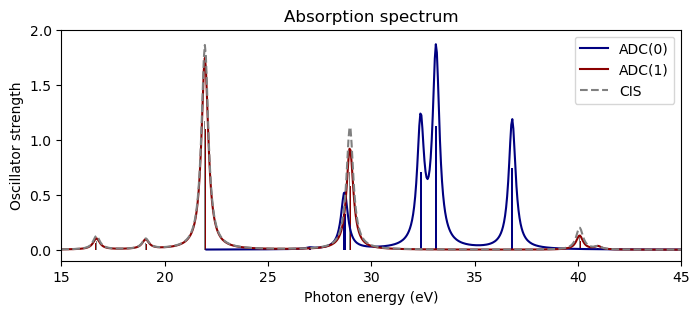

In [40]:
plt.figure(figsize=(8,3))

plt.bar(np.array(adc0_eigvals)*au2ev, adc0_osc_str, width=0.1, color="navy")
plt.bar(np.array(adc1_eigvals)*au2ev, adc1_osc_str, width=0.1, color="darkred")
plt.bar(np.array(adc1_eigvals)*au2ev, cis_osc_str, width=0.05, color="gray")


plt.plot(x_adc0, y_adc0, color="navy", label="ADC(0)")
plt.plot(x_adc1, y_adc1, color="darkred", label="ADC(1)")
plt.plot(x_cis, y_cis, "--", color="gray", label="CIS")

plt.xlim(15, 45)
plt.ylim(-0.1, 2.0)


plt.xlabel("Photon energy (eV)")
plt.ylabel("Oscillator strength")

plt.title("Absorption spectrum")
plt.legend()

plt.show()

In [41]:
# Compare to Gator
adc1_results = gator.run_adc(molecule, basis, scf, verbose=False, method='adc1',
                            singlets=nexc, tol=1e-5)

Starting adc1 singlet Jacobi-Davidson ...
Niter n_ss  max_residual  time  Ritz values
  1    10    2.3299e-27  161ms  [0.481 0.552 0.614 0.701 0.806 1.064 1.473]
=== Converged ===
    Number of matrix applies:    10
    Total solver time:           185.618ms


In [42]:
x_gator, y_gator = add_broadening(np.array(adc1_results.excitation_energy)*au2ev, adc1_results.oscillator_strength, step=0.05, gamma=0.4, sort=False)

In [43]:
print("Gator ADC(1) eigenvalues:")
print(adc1_results.excitation_energy)
print()
print("Our ADC(1) eigenvalues:")
print(adc1_eigvals)

Gator ADC(1) eigenvalues:
[ 0.481  0.552  0.614  0.701  0.806  1.064  1.473  1.506 20.104 20.154]

Our ADC(1) eigenvalues:
[ 0.481  0.552  0.614  0.701  0.806  1.064  1.473  1.506 20.104 20.154]


In [44]:
print("Gator ADC(1) oscillator strengths:")
print(adc1_results.oscillator_strength)
print()
print("Our ADC(1) oscillator strengths:")
print(np.array(adc1_osc_str))
print("\nCIS:")
print(np.array(cis_osc_str))

Gator ADC(1) oscillator strengths:
[0.003 0.    0.063 0.054 1.095 0.581 0.08  0.018 0.052 0.087]

Our ADC(1) oscillator strengths:
[0.003 0.    0.063 0.054 1.095 0.581 0.08  0.018 0.052 0.087]

CIS:
[0.004 0.    0.077 0.058 1.169 0.705 0.125 0.016 0.054 0.087]


In [45]:
cmap = colormaps['viridis']

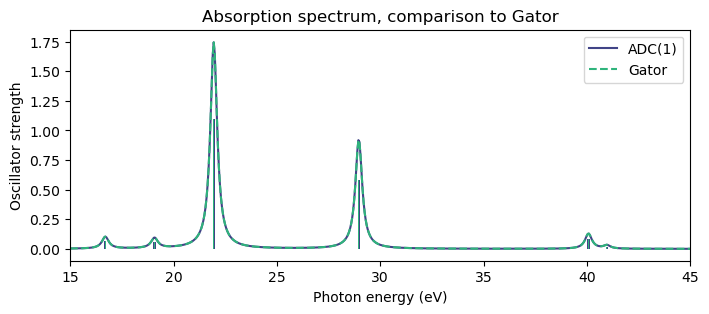

In [46]:
plt.figure(figsize=(8,3))

plt.bar(np.array(adc1_eigvals)*au2ev, adc1_osc_str, width=0.1, color=cmap(0.2))
plt.bar(np.array(adc1_results.excitation_energy)*au2ev, adc1_results.oscillator_strength, width=0.05, color=cmap(0.65))

plt.plot(x_adc1, y_adc1, color=cmap(0.2), label="ADC(1)")
plt.plot(x_gator, y_gator, '--', color=cmap(0.65), label="Gator")
#plt.plot(x_cis, y_cis, "--", color="gray", label="CIS")

plt.xlim(15, 45)
plt.ylim(-0.1, 1.85)


plt.xlabel("Photon energy (eV)")
plt.ylabel("Oscillator strength")

plt.title("Absorption spectrum, comparison to Gator")
plt.legend()

plt.show()

## Excited state analysis

It is very useful to further analyze the absorption spectrum and determine the nature of the excited state. For this purpose, the state density matrix (or rather the difference density matrix) can be partitioned in various ways. A particularly useful way is into attachment and detachment densities. By diagonalizing the attachment and detachment densities we can also calculate the so-called promotion numbers, i.e. the number of detached and attached electrons involved in the transition.

###  Attachment and detachment densities
Attachment and detachment densities can be obtained by diagonalizing the difference density matrix (i.e. the difference between the initial and final state densities). See [F. Plasser, M. Wormit, and A. Dreuw, J. Chem. Phys. 141, 024106 (2014)](https://pubs.aip.org/aip/jcp/article/141/2/024106/352448/New-tools-for-the-systematic-analysis-and)

$$\mathbf{W}^\mathrm{T} \boldsymbol{\gamma}_\Delta \mathbf{W}  = \kappa\, {\mathbb{1}}$$

The attachment density is constructed considering only the positive eigenvalues, while the detachment density considering only the negative eigenvalues
$$a_i = \max(\kappa_i, 0)$$
$$\boldsymbol{\gamma_a} = \mathbf{W}^{\mathrm{T}}(\mathbf{a}\mathbb{1})\mathbf{W}$$

$$d_i = \min(\kappa_i, 0)$$
$$\boldsymbol{\gamma_d} = \mathbf{W}^{\mathrm{T}}(\mathbf{d}\mathbb{1})\mathbf{W}$$

The one-particle state density matrices, can be identified by formally writing the excited state energy as
$$
E_n = \sum_{p,q}\gamma_{pq}f_{pq} + \frac14\sum_{pqrs}\Gamma_{pqrs}\langle pq||rs\rangle
$$

In the case of ADC(1), the energy of the n$\mathrm{th}$ excited state is:

$$
E_n = E_0 + \mathbf{X}_n^\dagger \left( \mathbf{M}^{(0)} + \mathbf{M}^{(1)}\right) \mathbf{X}_n
$$

The state density matrix is then obtained by identifying the terms between the two equations above. The difference density matrix is simply the difference between the state density and the ground state density matrix. For both ADC(0) and ADC(1), the difference density has two non-zero blocks, calculated as,

$$
\gamma_{ij} = -\sum_{a} x_{ia} x_{ja}
$$

$$
\gamma_{ab} = \sum_{i} x_{ia} x_{ib}
$$

###  Promotion numbers
The integrals over space of the corresponding attachment and detachment densities give the "promotion numbers" (how many electrons are involved in the transition). These are calculated as,
$$p_A = \mathrm{Tr}(\boldsymbol{\gamma_a}) = \sum_i a_i$$
$$p_D = \mathrm{Tr}(\boldsymbol{\gamma_d}) = \sum_i d_i$$

Let's write a routine to calculate the difference density matrix.

```python
def calculate_difference_density(x, nocc, nvir):
    """ Calculates the difference density matrix.

        :param x: the excitation vector.
        :param nocc: the number of occupied orbitals.
        :param nvir: the number of virtual orbitals.
    """
    ddm_mo = np.zeros((nocc+nvir, nocc+nvir))
    ddm_mo[:nocc, :nocc] = ...
    ddm_mo[nocc:, nocc:] = ...

    return ddm_mo
```

In [27]:
def calculate_difference_density(x, nocc, nvir):
    """ Calculates the difference density matrix.

        :param x: the excitation vector.
        :param nocc: the number of occupied orbitals.
        :param nvir: the number of virtual orbitals.
    """
    ddm_mo = np.zeros((nocc+nvir, nocc+nvir))
    ddm_mo[:nocc, :nocc] = -np.einsum('ia,ja->ij', x, x)
    ddm_mo[nocc:, nocc:] = np.einsum('ia,ib->ab', x, x)

    return ddm_mo

In [28]:
def get_attachement_detachement(density_mo, density_ao):
    # Symmetrize the density matrix
    # new_density = 0.5*( density + density.T)
    k, w = np.linalg.eigh(density_mo)
    k_ao, w_ao = np.linalg.eigh(density_ao)
    k_detach = k.copy()
    k_ao_d = k_ao.copy()
    k_attach = k.copy()
    k_ao_a = k_ao.copy()
    # Detachment: set positive eigenvalues to 0
    k_detach[k > 0] = 0
    k_ao_d[ k_ao > 0] = 0
    # Attachment: set negative eigenvalues to 0
    k_attach[k < 0] = 0
    k_ao_a[k_ao < 0] = 0
    # Back-transform with numpy
    detach_mo = w @ np.diag(k_detach) @ w.T
    attach_mo = w @ np.diag(k_attach) @ w.T

    detach_ao = w_ao @ np.diag(k_ao_d) @ w_ao.T
    attach_ao = w_ao @ np.diag(k_ao_a) @ w_ao.T
    return detach_ao, attach_ao, np.sum(k_detach), np.sum(k_attach)

Now we can use the VeloxChem visualization driver to obtain the attachment and detachment densities from the density matrices.

```python
p_a = []
p_d = []

mo_coeff = scf.scf_tensors['C_alpha']

vis_drv = vlx.VisualizationDriver()
cube_points = [40, 40, 40]
cubic_grid = vis_drv.gen_cubic_grid(molecule, cube_points)

for i in range(n_states):
    x = adc1_eigvecs[:, i].reshape(nocc, nvir)
    density_mo = calculate_difference_density(x, nocc, nvir)
    density_ao = np.linalg.multi_dot([mo_coeff, density_mo, mo_coeff.T])
    
    # get the detachment and attachment densities in AO basis, as well as
    # the promotion numbers.
    detach_adc1, attach_adc1, pd, pa = get_attachement_detachement(density_mo, density_ao)
    print("S%d. %.2f detached & %.2f attached electrons." % (i+1, pd, pa))

    # C-object necessary to write the densities to a cube file
    dens_DA = vlx.veloxchemlib.AODensityMatrix([detach_adc1, attach_adc1], vlx.veloxchemlib.denmat.rest)

    detach_cube_name = name + "_adc1_S%d_detach.cube" % (i+1)
    attach_cube_name = name + "_adc1_S%d_attach.cube" % (i+1)
    print("\nWriting cube files:... ", attach_cube_name, detach_cube_name)
    print()
    
    # Use the visualization driver to write the attachment and detachment densities to cube files
    vis_drv.compute(cubic_grid, molecule, basis, dens_DA, 0, 'alpha')
    vis_drv.write_data(detach_cube_name, cubic_grid, molecule,
                      'detachment', 0, 'alpha')
    vis_drv.compute(cubic_grid, molecule, basis, dens_DA, 1, 'alpha')
    vis_drv.write_data(attach_cube_name, cubic_grid, molecule,
                      'attachment', 1, 'alpha')
```

In [34]:
# Now let's have a look at these densities

In [35]:
index = 5 # index of the excited state
isoval_d = 0.001
isoval_a = 0.001

In [36]:
print("              Detachment density                                    Attachment density")
print()

viewer = p3d.view(linked=True, viewergrid=(1, 2), width=800, height=300)

folder = "../../data/adc/"

name_d = folder + name + "_adc1_S%d_detach.cube" % (index)
name_a = folder + name + "_adc1_S%d_attach.cube" % (index)

# Detachment density
with open(name_d, "r") as f:
    cube = f.read()
# Plot molecule and density structures
viewer.addModel(cube, "cube", viewer=(0, 0))
viewer.setStyle({"stick": {}, "sphere": {"scale":0.25}}, viewer=(0, 0))

# Negative and positive nodes
viewer.addVolumetricData(
    cube, "cube", {"isoval": -isoval_d, "color": "blue", "opacity": 0.75}, viewer=(0, 0)
)
viewer.addVolumetricData(
    cube, "cube", {"isoval": isoval_d, "color": "red", "opacity": 0.75}, viewer=(0, 0)
)


# Attachment density
with open(name_a, "r") as f:
    cube = f.read()
# Plot molecule and density structures
viewer.addModel(cube, "cube", viewer=(0, 1))
viewer.setStyle({"stick": {}, "sphere": {"scale":0.25}}, viewer=(0, 1))

# Negative and positive nodes
viewer.addVolumetricData(
    cube, "cube", {"isoval": -isoval_a, "color": "blue", "opacity": 0.75}, viewer=(0, 1)
)
viewer.addVolumetricData(
    cube, "cube", {"isoval": isoval_a, "color": "red", "opacity": 0.75}, viewer=(0, 1)
)

viewer.rotate(-90,'x')
viewer.show()

x = adc1_eigvecs[:, index-1].reshape(nocc, nvir)
print("Energy and oscillator strength: %.2f eV, %.5f." % (adc1_eigvals[index-1]*au2ev, adc1_osc_str[index-1]))
print()
txt = "       "
for a in range(nvir):
    txt += "    Vir %d " % (a + 1)
print(txt+"\n")
for i in range(nocc):
    txt = "Occ %d: " % (i + 1)
    for a in range(nvir):
        txt += "%9.3f " % x[i,a]
    print(txt)
#print(x)

              Detachment density                                    Attachment density



You appear to be running in JupyterLab (or JavaScript failed to load for some other reason). You need to install the 3dmol extension: 
 jupyter labextension install jupyterlab_3dmol

Energy and oscillator strength: 21.94 eV, 1.09469.

           Vir 1     Vir 2 

Occ 1:    -0.000    -0.001 
Occ 2:     0.000    -0.048 
Occ 3:     0.904    -0.000 
Occ 4:     0.000     0.425 
Occ 5:     0.000     0.000 
